In [1]:
import numpy as np
import matplotlib.pyplot as plt
import IPython

# 1. Datasets
#### Problem
- Detect if an audio wav contains the word "activate"

## 1.1 Dataset
- `audios`
    - The `activate` directory contains positive examples of people saying the word "activate". 
    - The `negatives` directory contains negative examples of people saying a random word other than "activate". 
    - The `backgrounds` directory contains 10 second clips of background noise in different environments.
    
- There is one word per audio recording. 

In [2]:
IPython.display.Audio("./datasets/audios/activates/1.wav")

In [3]:
IPython.display.Audio("./datasets/audios/negatives/1.wav")

In [4]:
IPython.display.Audio("./datasets/audios/backgrounds/1.wav")

#### Load dataset

In [5]:
import os

def load_dset(path):
    activates = []
    backgrounds = []
    negatives = []
    for filename in os.listdir(path + "/activates"):
        if filename.endswith("wav"):
            activates.append(path + "/activates/" + filename)
    for filename in os.listdir(path + "/backgrounds"):
        if filename.endswith("wav"):
            backgrounds.append(path + "/backgrounds/" + filename)
    for filename in os.listdir(path + "/negatives"):
        if filename.endswith("wav"):
            negatives.append(path + "/negatives/" + filename)
    return activates, negatives, backgrounds

In [6]:
activates, negatives, backgrounds = load_dset('./datasets/audios')

print(len(activates))
print(len(negatives))
print(len(backgrounds))

10
10
2


## 1.2 Spectrogram
- The spectrogram tells us how much different frequencies are present in an audio clip at any moment in time. 
- A spectrogram is computed by sliding a window over the raw audio signal, and calculating the most active frequencies in each window using a Fourier transform.

<img src="./assets/LSTM_spectrogram.png" width="750"/>

- The color in the spectrogram shows the degree to which different frequencies are present (loud) in the audio at different points in time. 
    - Green squares = a certain frequency is more active or more present in the audio clip (louder).
    - Blue squares = less active frequencies.

In [7]:
from scipy.io import wavfile


def load_wav(wav_file):
    sr, data = wavfile.read(wav_file)
    return sr, data

In [8]:
wav_f_path = "./datasets/audios/audio_examples/example_train.wav"
sr, x_np = load_wav(wav_f_path)
duration_s = len(x_np) / sr
num_channels = x_np.shape[1]

print(f"""[Before spectrogram]
timesteps = {x_np.shape}
Number of channels = {num_channels}
Sampling rate = {sr} Hz
Duration = {duration_s:.2f} sec""")
IPython.display.Audio(wav_f_path)

[Before spectrogram]
timesteps = (441000, 2)
Number of channels = 2
Sampling rate = 44100 Hz
Duration = 10.00 sec


In [9]:
def plot_spectrogram(x_np, sr=44100):
    # params
    nfft = 256 # Length of fft
    nperseg = 256 # Length of each segment
    noverlap = 128 # Overlap between windows
    n_channels = x_np.ndim

    # Plot
    plt.figure(figsize=(20,5))
    if n_channels == 1:
        pxx, freqs, bins, im = plt.specgram(x_np, NFFT=nfft, Fs=sr, noverlap=noverlap)
    elif n_channels == 2:
        pxx, freqs, bins, im = plt.specgram(x_np[:, 0], NFFT=nfft, Fs=sr, noverlap=noverlap)
    plt.show()
    
    # Return spectrogram
    return pxx

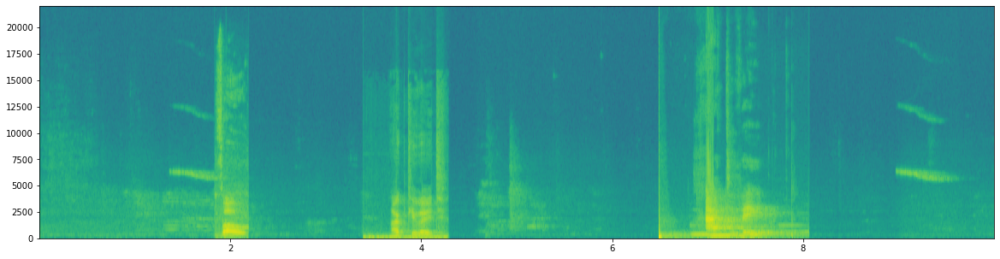

Time steps in input after spectrogram (129, 3444)
Tx = 3444, n_freq = 129


In [10]:
x_spec = plot_spectrogram(x_np, sr)
print(f"Time steps in input after spectrogram {x_spec.shape}")

# The number of time steps input to the model from the spectrogram
Tx = x_spec.shape[1]

# Number of frequencies input to the model at each time step of the spectrogram
n_freq = x_spec.shape[0]

print(f"{Tx = }, {n_freq = }")

# 2. Feature Engineering

## 2.1 Synthesize
#### Synthesize Audio
- In real world, it hard to label the audio/speech data
- Speech synthesize to generate training data
    - Pick a random 10 sec background audio clip
    - Randomly insert 0-4 audio clips of "activate" into this 10 sec. clip
    - Randomly insert 0-2 audio clips of negative words into this 10 sec. clip
- After synthesizing, you know exactly where are the "activate" to generate labels 

In [11]:
def get_random_time_segment(segment, duration):
    """
    Gets a random time segment within duration
    
    Arguments:
        segment (int)    : Inserted segment length
        duration (int)   : the duration of the audio clip
    
    Returns:
        segment_time (tuple(int, int))  : a tuple of (segment_start, segment_end)
    """
    # Make sure segment doesn't run past the background 
    segment_start = np.random.randint(low=0, high=duration-segment)
    segment_end = segment_start + segment - 1
    return (segment_start, segment_end)

In [12]:
def is_overlapping(new_seg, seg_lists):
    """
    Checks if the time of the new_seg overlaps any sement in seg_lists
    
    Arguments:
        new_seg (tuple(int,int))            : (segment_start, segment_end) of the new new_seg
        seg_lists (list of tuple(int,int))  : list of (segment_start, segment_end) for the existing segments
    
    Returns:
        True if the time new_seg overlaps with any of the existing segments, False otherwise
    """
    
    segment_start, segment_end = new_seg
    
    for previous_start, previous_end in seg_lists:
        a = max(segment_start, previous_start)
        b = min(segment_end, previous_end)
        if a <= b:
            return True

    return False

In [13]:
def insert_audio_clip(background, audio_clip, previous_segments):
    """
    Insert a new audio segment over the background noise at a random time step
        ensuring that the audio segment does not overlap with existing segments.

    Arguments:
        background (nparray (n,))                   : a 10 second background audio recording.  
        audio_clip (nparray (n,))                   : the audio clip to be inserted/overlaid. 
        previous_segments (list of tuple(int,int))  : list of timestamps where audio segments have already been placed
    
    Returns:
        new_background (wav)            : the updated background audio
    """
    # Get the duration of audio clip and background
    segment = audio_clip.shape[0]
    duration = background.shape[0]
    
    # Initialize
    new_background = background.copy()

    # Random new timestamp
    segment_time = get_random_time_segment(segment, duration=duration)
    
    # Try adding + avoid overlapping
    retry = 5
    while is_overlapping(segment_time, previous_segments) and retry >= 0:
        segment_time = get_random_time_segment(segment, duration=duration)
        retry -= 1

    if not is_overlapping(segment_time, previous_segments):
        # Superpose audio segment and background (all channels)
        new_background[segment_time[0]:segment_time[1]+1] += audio_clip
    else:
        segment_time = None
    return new_background, segment_time

#### Labeling
- The model is to detect when someone has **finished** saying "activate". 
    - $y^{\langle t \rangle}$ represent whether or not someone has just finished saying "activate". 
    - $y^{\langle t \rangle} = 1$ when that clip has finished saying "activate".
- Given a background clip, we can initialize $y^{\langle t \rangle}=0$ for all $t$, since the clip doesn't contain any "activate". 
    + When you insert or overlay an "activate" clip, you will also update labels for $y^{\langle t \rangle}$.
    + Rather than updating the label of a single time step, we will update 50 steps of the output to have target label 1. 
    - Updating several consecutive time steps can make the training data more balanced.
    
<img src="./assets/label_diagram.png" width="550"/>


In [14]:
def insert_ones(y, segment_end, sr=44100):
    """
    Update label y , mask 1 for 200ms timesteps after segment_end
    
    Arguments:
        y (ndarray (Ty,))    : the labels of the training example
        segment_end_ms (int) : the end time of the inserted segment

    Returns:
        y (ndarray (Ty,))    : updated labels
    """
    Ty = y.shape[0]
    
    # duration of the background (in terms of spectrogram time-steps)
    start_idx = int(segment_end)
    end_idx = min(int(start_idx+1.0*sr), Ty)

    y[start_idx:end_idx] = 1
    return y

In [15]:
def rescale_y(y, rescale=10):
    """
    Rescale y to reduce dimension
    
    Arguments:
        y (ndarray (Ty,))    : the labels of the training example
        rescale (int)        : resampling scale

    Returns:
        y (ndarray (Ty,))    : resaled labels
    """
    new_y = []
    for i in range(0, y.shape[0], rescale):
        new_y.append(y[i])

    return np.array(new_y)

#### Create 1 training example

In [16]:
from scipy import signal

def create_training_example(background, activates, negatives):
    """
    Creates a training example with a given background, activates, and negatives.
    
    Arguments:
        background (wav_f_path)            : a 10 second background audio recording
        activates (list of wav_f_path)     : a list of audio segments of the word "activate"
        negatives (list of wav_f_path)     : a list of audio segments of random words that are not "activate"

    Returns:
        x (ndarray (n_freq, Tx))      : the spectrogram of the training example
        y (ndarray (Ty,))             : the label at each time step of the spectrogram
    """
    ## Load background
    sr, background = load_wav(background)

    ## Extract only 1 channel
    if background.ndim == 2:
        background = background[:, 0].copy()
    else:
        background = background.copy()
        
    ## get dim, 1 bin of Ty = 1 ms
    Ty = int(background.shape[0])
    
    # 1. Preset
    ## Make background quieter
    background = background - 50

    ## Initialize data structures
    y = np.zeros((Ty,))
    segments = []
    
    # 2. Add activates
    ## Select 0-4 random "activate" audio clips from the entire list of "activates" recordings
    number_of_activates = np.random.randint(0, 5)
    random_indices = np.random.randint(len(activates), size=number_of_activates)
    random_activates = [activates[i] for i in random_indices]
    
    ## Insert activate
    for random_activate in random_activates:
        # load
        _, random_activate = load_wav(random_activate)
        if random_activate.ndim == 2:
            random_activate = random_activate[:,0]
        
        # Insert voice
        background, segment_time = insert_audio_clip(background, random_activate, segments)
        if segment_time != None:
            segments.append(segment_time)
            y = insert_ones(y, segment_time[1], sr=sr)

    # 3. Add negatives
    ## Select 0-2 random negatives audio recordings from the entire list of "negatives" recordings
    number_of_negatives = np.random.randint(0, 3)
    random_indices = np.random.randint(len(negatives), size=number_of_negatives)
    random_negatives = [negatives[i] for i in random_indices]

    ## Insert negatives
    for random_negative in random_negatives:
        # load
        _, random_negative = load_wav(random_negative)
        if random_negative.ndim == 2:
            random_negative = random_negative[:,0]

        # Insert voice
        background, _ = insert_audio_clip(background, random_negative, segments)

    # 4. Get spectrogram x
    ## spectrogram
    nfft = 256 # Length of fft
    nperseg = 256 # Length of each segment
    noverlap = 128 # Overlap between windows
    f, t, x_spec = signal.spectrogram(background, sr,
        nperseg=nperseg, nfft=nfft, noverlap=noverlap)
    return background, x_spec, y, segments

x_np.shape = (441000,), x_spec.shape = (3444, 129), y.shape = (441000,), y_scaled.shape = (882,)
activate_segments = [(48987, 77861), (313793, 346029)]
Tx = 3444, n_freq = 129


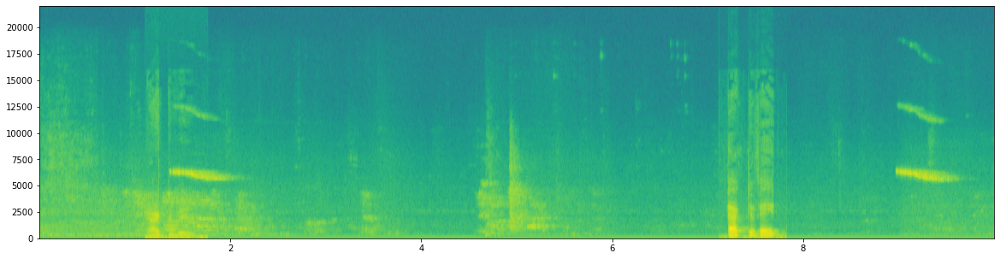

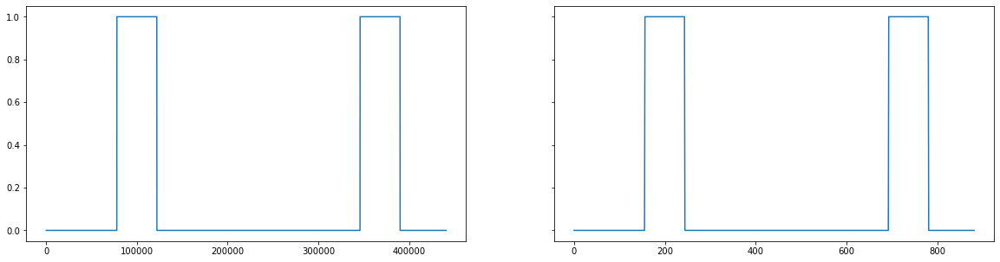

In [17]:
np.random.seed(4543)
x_np, x_spec, y, activate_segments = create_training_example(backgrounds[0], activates, negatives)

# swap axis x + rescaled y 
y_scaled = rescale_y(y, 500)
x_spec = x_spec.T

Tx, n_freq =x_spec.shape
print(f'{x_np.shape = }, {x_spec.shape = }, {y.shape = }, {y_scaled.shape = }')
print(f'{activate_segments = }')
print(f"{Tx = }, {n_freq = }")

_ = plot_spectrogram(x_np)
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(20,5), sharey=True)
axs[0].plot(y); axs[1].plot(y_scaled);
plt.show()

In [18]:
import soundfile as sf

sf.write('/tmp/train_sample.wav', x_np, 44100, 'PCM_16')
IPython.display.Audio("/tmp/train_sample.wav")

## 2.2 Generate all set

#### Train

In [19]:
np.random.seed(4543)
X_train = []
Y_train = []
for i in range(128):
    _, x_spec, y, _ = create_training_example(backgrounds[i%2], activates, negatives)
    
    # swap axis x + rescaled y 
    y_scaled = rescale_y(y, 500)
    x_spec = x_spec.T

    # stack
    X_train.append(x_spec)
    Y_train.append(y_scaled)

X_train = np.array(X_train)
Y_train = np.array(Y_train)

# X_train = (batch_size, Tx, feat_dim(freq_bin))
print(f'{X_train.shape = }, {Y_train.shape = }')

X_train.shape = (128, 3444, 129), Y_train.shape = (128, 882)


# 3. Model

<img src="./assets/LSTM_model.png" width="770"/>


In [20]:
import torch
import torch.nn as nn

In [21]:
class Net(nn.Module):
    def __init__(self, Tx, Ty):
        super(Net, self).__init__()
        # params
        self.rnn_hidden_dim = 128
        self.feat_dim = 29
        self.num_layers = 2

        # TDNN
        self.tdnn = nn.Conv1d(
            in_channels=Tx,
            out_channels=Ty,
            kernel_size=15,
            stride=4)
        self.tdnn_bn = nn.BatchNorm1d(num_features=Ty)
        self.tdnn_relu = nn.ReLU()
        self.tdnn_dropout = nn.Dropout(0.8)

        # LSTM 1
        self.rnn1 = nn.LSTM(
            input_size=self.feat_dim,
            hidden_size=self.rnn_hidden_dim,
            num_layers=self.num_layers,
            batch_first=True,
            bidirectional=False, dropout=0.8)
        self.rnn1_bn = nn.BatchNorm1d(num_features=Ty)

        # LSTM 2
        self.rnn2 = nn.LSTM(
            input_size=self.rnn_hidden_dim,
            hidden_size=self.rnn_hidden_dim,
            num_layers=self.num_layers,
            batch_first=True,
            bidirectional=False, dropout=0.8)
        self.rnn2_bn = nn.BatchNorm1d(num_features=Ty)

        # FC
        self.fc = nn.Linear(
            in_features=self.rnn_hidden_dim,
            out_features=1)
        self.sigmoid = nn.Sigmoid()

    def init_hc(self, batch_size, device='cpu'):
        h0 = torch.zeros(self.num_layers, batch_size, self.rnn_hidden_dim).float().to(device)
        c0 = torch.zeros(self.num_layers, batch_size, self.rnn_hidden_dim).float().to(device)
        return h0, c0

    def forward(self, X, device='cpu'):
        '''
        X shape = (batch_size, Tx, feat_dim(freq_bins))
        '''
        # get batchsize
        m = X.size(0)
        
        # TDNN Layer: (m, Tx, 129) -> (m, Ty, 29) 
        o = self.tdnn(X)
        o = self.tdnn_bn(o)
        o = self.tdnn_relu(o)
        o = self.tdnn_dropout(o)

        # RNN 1 Layer: (m, Ty, 29) -> (m, Ty, 128)
        h1_0, c1_0 = self.init_hc(batch_size=m, device=device)
        o1, (h1, c1) = self.rnn1(o, (h1_0, c1_0))
        o1 = self.rnn1_bn(o1)

        # RNN 2 Layer: (m, Ty, 128) -> (m, Ty, 128)
        h2_0, c2_0 = self.init_hc(batch_size=m, device=device)
        o2, (h2, c2) = self.rnn2(o1, (h2_0, c2_0))
        o2 = self.rnn2_bn(o2)

        # Fc: (m, Ty, 128) -> (m, Ty, 1) -> (m, Ty)
        o = self.fc(o2)
        o = self.sigmoid(o)
        return o.squeeze()

# 4. Train

In [22]:
from torch.utils.data import TensorDataset, DataLoader

def fit(
        X, Y,
        alpha=1e-2, num_iters=1000, batch_size=16):
    """
    Train Fully Connected NN - 2 Layer - Binary Classification

    Arguments:
        X : (m, Tx, feat_dim)
        Y : (m, Ty)

    Returns:
        J_history : History of Cost function for plotting
    """
    # Retrieve dim
    m, Tx, feat_dim = X.shape
    _, Ty = Y.shape

    # Dataset
    dset = TensorDataset(
        torch.Tensor(X),
        torch.Tensor(Y))

    # Dataloader
    dloader = DataLoader(
        dataset=dset,
        batch_size=batch_size)

    ## Config
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Model
    model = Net(
        Tx=Tx,
        Ty=Ty)
    model = model.to(device)
    model.train()

    criterion = nn.BCELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=alpha)

    # cost and params history
    J_history = []
    for i in range(num_iters):
        cost = 0
        # Batch: X_b = (batch_size, Tx, feat_dim) y_b = (batch_size, Ty)
        for b, batch in enumerate(dloader):
            Xb, Yb = batch
            Xb = Xb.to(device).float()
            Yb = Yb.to(device).to(torch.float32)

            # Forward
            optimizer.zero_grad()
            Yb_hat = model(Xb, device=device)

            # train loss
            cost_b = criterion(Yb_hat, Yb)
            # Track Cost
            cost += cost_b.item()

            # Back Propagation
            cost_b.backward()
            optimizer.step()

        # Compute Cost
        J_history.append(cost)
        if i % 200 == 0 or i == num_iters-1:
            print("Cost after iteration %i: %f" % (i, cost))
    return model, J_history

In [23]:
model, J_hist = fit(
    X=X_train, Y=Y_train,
    alpha=1e-4, num_iters=1000, batch_size=32)

Cost after iteration 0: 2.251677
Cost after iteration 200: 0.050726
Cost after iteration 400: 0.032572
Cost after iteration 600: 0.026101
Cost after iteration 800: 0.023432
Cost after iteration 999: 0.016965


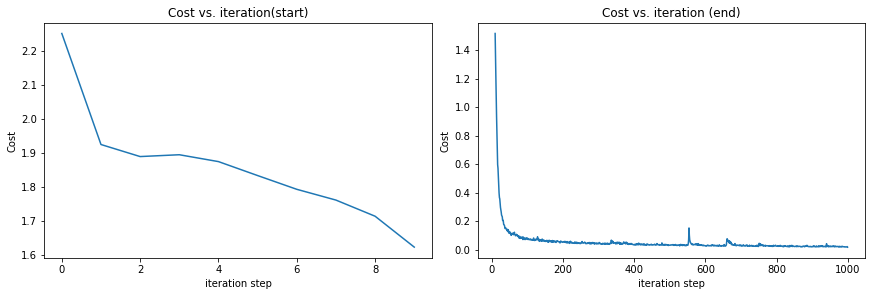

In [24]:
fig, (ax1, ax2) = plt.subplots(1, 2, constrained_layout=True, figsize=(12,4))

ax1.plot(J_hist[:10])
ax2.plot(10 + np.arange(len(J_hist[10:])), J_hist[10:])
ax1.set_title("Cost vs. iteration(start)");  ax2.set_title("Cost vs. iteration (end)")
ax1.set_ylabel('Cost')            ;  ax2.set_ylabel('Cost')
ax1.set_xlabel('iteration step')  ;  ax2.set_xlabel('iteration step')
plt.show()

# 5. Inference

In [25]:
# chime audio
IPython.display.Audio('./datasets/audios/dev/chime.wav')

#### Add chime after each "activate"

In [26]:
def add_chime(test_wav_fpath, model, scaled=10, threshold=0.5):
    # Load test wav
    sr, x_test_np = load_wav(test_wav_fpath)
    if x_test_np.ndim == 2:
        x_test_np = x_test_np[:,0]

    # Get spectrogram X_test
    nfft = 256 # Length of fft
    nperseg = 256 # Length of each segment
    noverlap = 128 # Overlap between windows
    f, t, x_spec = signal.spectrogram(x_test_np, sr,
        nperseg=nperseg, nfft=nfft, noverlap=noverlap)

    # swap axis x_test
    x_spec = x_spec.T
    x_spec = torch.Tensor(x_spec).unsqueeze(dim=0)

    # Infere
    model.to('cpu')
    model.eval()
    with torch.no_grad():
        y_hat = model(x_spec).numpy()
    
    # Get "activate" in y_hat
    consecutive = 0
    activates = []
    for t in range(y_hat.shape[0]):
        # Get consecutive signal
        if y_hat[t] > threshold: 
            consecutive += 1
        elif y_hat[t] < threshold:
            consecutive = 0

        # "activate" detected
        if consecutive >= 5:
            activates.append(t*scaled)
            consecutive = 0
    print(f'Number of "activate" detected: {len(activates)}')

    # Load chime
    sr, chime = load_wav('./datasets/audios/dev/chime.wav')
    if chime.ndim == 2:
        chime = chime[:,0]

    # Add chime to test file
    for t_act in activates:
        x_test_np[t_act:t_act+chime.shape[0]] += chime

    return x_test_np

#### test 1

In [27]:
IPython.display.Audio("./datasets/audios/dev/1.wav")

In [28]:
added_chime = add_chime('./datasets/audios/dev/1.wav', model)

sf.write('/tmp/1.wav', added_chime, 44100, 'PCM_16')
IPython.display.Audio("/tmp/1.wav")

Number of "activate" detected: 0
